## What Makes a Neighborhood "The Best"?
This is a data driven argument to find the best neighborhood in Pittsburgh, using a weighted metric system that scores neighborhoods based off of their crime rate, number of fire incidents, and the number of public parks in vicinity.

In [1]:
# Necessary libraries
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import folium
from folium.plugins import HeatMap
from folium.plugins import MarkerCluster

### 🔍 Part 1 – Exploring Crime Rates - Analysis by Manny
A good community should ideally have lower crime rates to accommodate its residents.

In [2]:
crime_data = pd.read_csv("crime_data.csv", encoding = "latin1", low_memory = False)

In [3]:
crime_data.head()

,PK,CCR,HIERARCHY,INCIDENTTIME,INCIDENTLOCATION,CLEAREDFLAG,INCIDENTNEIGHBORHOOD,INCIDENTZONE,HIERARCHYDESC,OFFENSES,INCIDENTTRACT,X,Y
0,2075487,5000381,6,1/1/2005 8:00,"5400 Block NORTHUMBERLAND ST PITTSBURGH, PA",N,Squirrel Hill North,4,MOTOR THEFT (OTHER)-PLATE ONLY,3921 Theft by Unlawful Taking or Disposition.,1401.0,-79.934027,40.438870
1,2075783,5001279,7,1/3/2005 2:00,"PARKVIEW PITTSBURGH, PA",N,Squirrel Hill North,4,MTR VEH THEFT (AUTO),3921 Theft by Unlawful Taking or Disposition.,407.0,0.000000,0.000000
2,2075786,5001488,7,1/3/2005 17:00,"CROSBY AND PAULINE & PITTSBURGH, PA",N,Squirrel Hill North,3,MOTOR VEH THEFT/TRUCK-BUS,3921 Theft by Unlawful Taking or Disposition.,1907.0,0.000000,0.000000
3,2076278,5002628,7,1/5/2005 19:30,"1100 Block COLFAX ST PITTSBURGH, PA",N,Squirrel Hill North,1,MTR VEH THEFT (AUTO),3921 Theft by Unlawful Taking or Disposition.,2102.0,-80.024329,40.462542
4,2076279,5002647,7,1/5/2005 20:20,"ALDER/SHADY & PITTSBURGH, PA",N,Shadyside,4,MTR VEH THEFT (AUTO),3921 Theft by Unlawful Taking or Disposition.,705.0,0.000000,0.000000


In [4]:
# Deal with Mt. Oliver duplicates
crime_data['INCIDENTNEIGHBORHOOD'] = crime_data['INCIDENTNEIGHBORHOOD'].replace({
    'Mt. Oliver Neighborhood': 'Mount Oliver',
    'Mt. Oliver Boro': 'Mount Oliver',
    'Mount Oliver Borough': 'Mount Oliver'
})

In [5]:
# Check unique vals. to ensure no duplicates (like with Mt. Oliver above)
# Not going to consider differences between different parts of towns (i.e North Oakland and South Oakland)
crime_data["INCIDENTNEIGHBORHOOD"].unique()

array(['Squirrel Hill North', 'Shadyside', 'Bedford Dwellings',
       'Lincoln-Lemington-Belmar', 'Lower Lawrenceville',
       'Central Lawrenceville', 'Golden Triangle/Civic Arena', 'Carrick',
       'Highland Park', 'South Side Flats', 'Middle Hill',
       'North Oakland', 'Bloomfield', 'Outside City', 'East Hills',
       'Knoxville', 'Point Breeze', 'Central Oakland', 'Brighton Heights',
       'Point Breeze North', 'Homewood North', 'Regent Square',
       'Homewood West', 'Homewood South', 'Perry North', nan,
       'West Oakland', 'Hazelwood', 'St. Clair', 'Northview Heights',
       'Oakwood', 'Arlington', 'North Shore', 'Westwood', 'Upper Hill',
       'Polish Hill', 'Crawford-Roberts', 'Lincoln Place',
       'Allegheny West', 'Larimer', 'Glen Hazel', 'Bon Air',
       'Arlington Heights', 'Allentown', 'New Homestead', 'Hays',
       'Central Northside', 'Stanton Heights', 'Allegheny Center',
       'Friendship', 'East Carnegie', 'Fairywood', 'Windgap',
       'Squirrel Hi

#### Towns (Lowest Crime):

In [6]:
crime_counts = crime_data["INCIDENTNEIGHBORHOOD"].value_counts()
safest_neighborhoods = crime_counts.sort_values().head(10)
print("Safest Neighborhoods (Fewest Crimes Reported):")
print(safest_neighborhoods)

Safest Neighborhoods (Fewest Crimes Reported):
INCIDENTNEIGHBORHOOD
Outside County       201
Outside State        202
Chartiers City       427
New Homestead        459
Swisshelm Park       616
East Carnegie        734
Summer Hill          784
Ridgemont            817
Hays                 875
Arlington Heights    902
Name: count, dtype: int64


Based off the list, excluding neighborhoods outside of Allegeny County, Chartiers City is the neighborhood with the fewest crimes reported. 
If this was the only metric measured, this would be the best neighborhood in Pittsburgh.

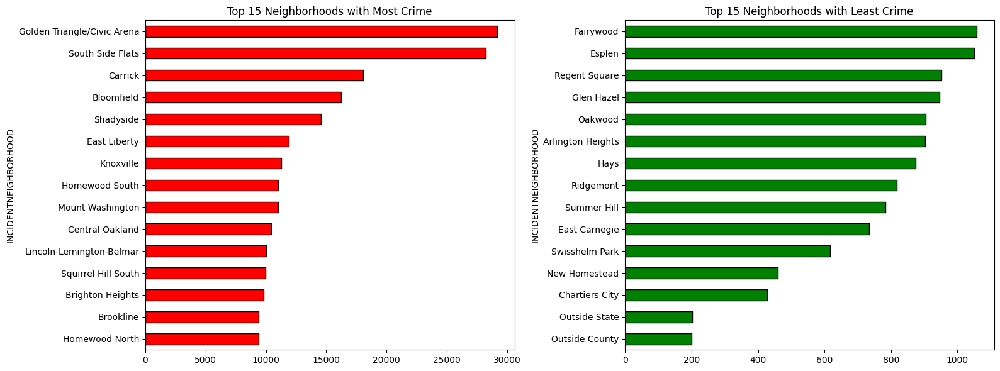

In [7]:
fig, ax = plt.subplots(1, 2, figsize = (16, 6))
crime_counts.head(15).plot(kind = "barh", ax = ax[0], color = "red", edgecolor = "black")
ax[0].set_title("Top 15 Neighborhoods with Most Crime")
ax[0].invert_yaxis()
crime_counts.tail(15).plot(kind = "barh", ax = ax[1], color = "green", edgecolor = "black")
ax[1].set_title("Top 15 Neighborhoods with Least Crime")
ax[1].invert_yaxis()
plt.tight_layout()
plt.show()

Above is a visualization to see crime rates compared to each other.

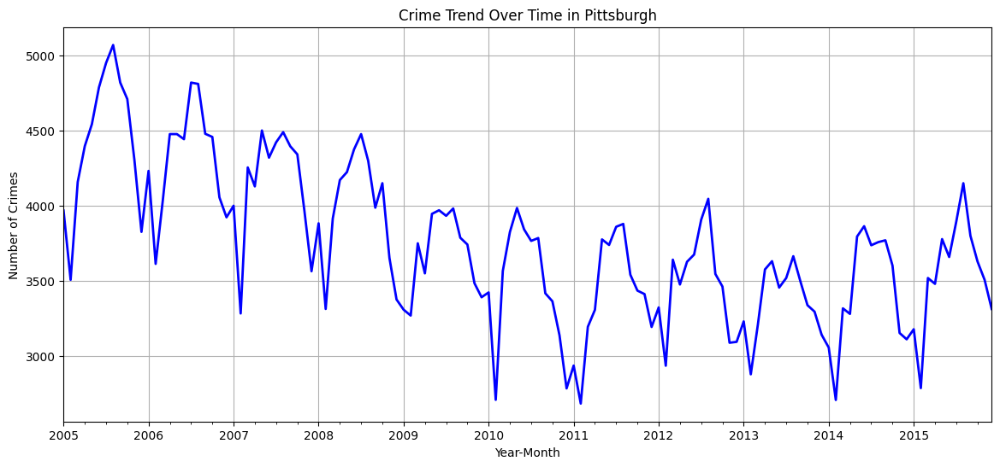

In [8]:
crime_data["INCIDENTTIME"] = pd.to_datetime(crime_data["INCIDENTTIME"], errors = "coerce")
crime_data["YEAR"] = crime_data["INCIDENTTIME"].dt.year
crime_data["MONTH"] = crime_data["INCIDENTTIME"].dt.to_period("M")
monthly_crime = crime_data["MONTH"].value_counts().sort_index()
plt.figure(figsize = (14, 6))
monthly_crime.plot(color = "blue", linewidth = 2)
plt.title("Crime Trend Over Time in Pittsburgh")
plt.xlabel("Year-Month")
plt.ylabel("Number of Crimes")
plt.grid()

This visualization above shows crime trends over time in Pittsburgh. Using this, we can see crime is decreasing, meaning if crime is increasing in a given area, it is abnormal behavior compared to the general trend of the city at the moment.

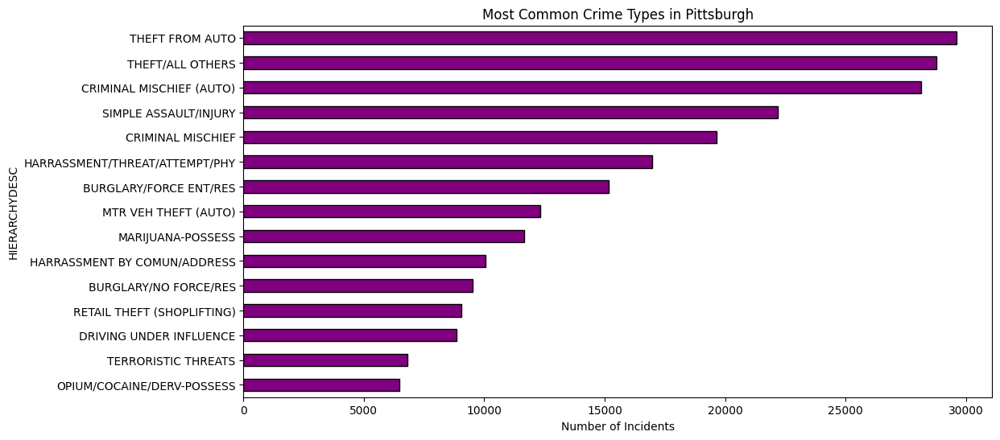

In [9]:
crime_types = crime_data["HIERARCHYDESC"].value_counts()
plt.figure(figsize = (12, 6))
crime_types.head(15).plot(kind = "barh", color = "purple", edgecolor = "black")
plt.title("Most Common Crime Types in Pittsburgh")
plt.xlabel("Number of Incidents")
plt.gca().invert_yaxis()
plt.show()

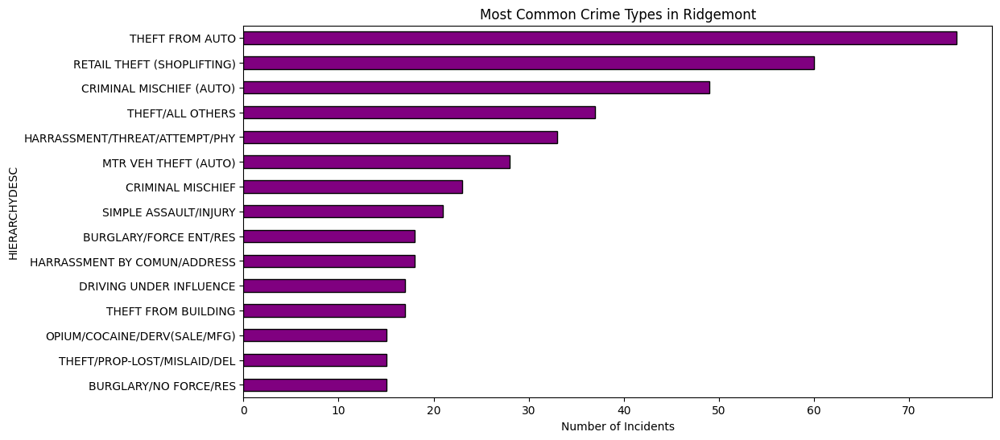

In [10]:
ridgemont_crimes = crime_data[crime_data['INCIDENTNEIGHBORHOOD'] == 'Ridgemont']
crime_types_ridgemont = ridgemont_crimes["HIERARCHYDESC"].value_counts()
plt.figure(figsize = (12, 6))
crime_types_ridgemont.head(15).plot(kind = "barh", color = "purple", edgecolor = "black")
plt.title("Most Common Crime Types in Ridgemont")
plt.xlabel("Number of Incidents")
plt.gca().invert_yaxis()
plt.show()

Comparing Ridgemont (the winner) to general city crime types above. Notice: Ridgemont doesn't seem to have a lot of violent crimes, once again revealing an appealing argument for the town.

In [11]:
crime_data_filtered = crime_data.dropna(subset = ["X", "Y"])
crime_data_filtered = crime_data_filtered[(crime_data_filtered["X"] != 0) & (crime_data_filtered["Y"] != 0)]
m = folium.Map(location = [40.4406, -79.9959], zoom_start = 12)
HeatMap(data = crime_data_filtered[["Y", "X"]], radius = 10).add_to(m)
m

Crimes reported also have latitude and longitude in the dataset, so we can build a heatmap to give a visual of the places that get the most or the least crime!

We can also notice in the south of the city, where Ridgemont is located, the crime concentration is rather promising.

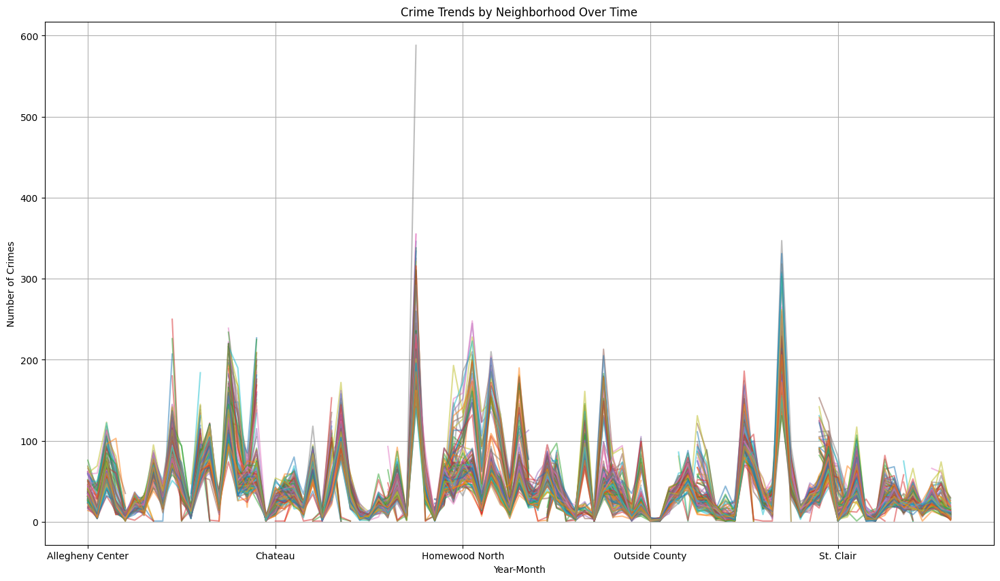

In [12]:
crime_by_neighborhood_month = crime_data.groupby(["MONTH", "INCIDENTNEIGHBORHOOD"]).size().unstack()
crime_by_neighborhood_month.T.plot(figsize = (18, 10), alpha = 0.5, legend = False)
plt.title("Crime Trends by Neighborhood Over Time")
plt.xlabel("Year-Month")
plt.ylabel("Number of Crimes")
plt.grid()
plt.show()

It seems most towns are following the general city trends... but it's a little hard to see. Below we can take a look at what the actual changes in crime are like to get a holistic idea quantitatively.

#### Lists of neighborhoods with decreasing crime rate and increasing crime rate:

In [13]:
# Convert to date-time type of data
crime_data["INCIDENTTIME"] = pd.to_datetime(crime_data["INCIDENTTIME"], errors = "coerce")
crime_data["YEAR"] = crime_data["INCIDENTTIME"].dt.year

In [14]:
crime_data["YEAR"] = crime_data["INCIDENTTIME"].dt.year
crime_trend = crime_data.groupby(["YEAR", "INCIDENTNEIGHBORHOOD"]).size().unstack()
crime_trend_pct_change = crime_trend.pct_change(fill_method = None).fillna(0).mean().sort_values()
print("Neighborhoods with decreasing crime:")
print(crime_trend_pct_change.head(10))
print("Neighborhoods with increasing crime:")
print(crime_trend_pct_change.tail(10))

Neighborhoods with decreasing crime:
INCIDENTNEIGHBORHOOD
St. Clair        -0.131162
Homewood West    -0.101206
Ridgemont        -0.100096
Friendship       -0.098732
Outside City     -0.096639
Bloomfield       -0.084289
East Carnegie    -0.083591
North Oakland    -0.082162
Homewood South   -0.080863
Lincoln Place    -0.079620
dtype: float64
Neighborhoods with increasing crime:
INCIDENTNEIGHBORHOOD
Crafton Heights          20.770526
Chateau                  20.804929
Morningside              23.300574
California-Kirkbride     24.081988
South Side Slopes        25.104863
South Shore              26.694322
Spring Hill-City View    32.713820
Beltzhoover              33.359215
South Oakland            35.274691
Terrace Village          51.556502
dtype: float64


Evidently we can see St. Clair is doing the best with crime reduction, while Crafton Heights is doing a poor job by comparison. Ridgemont (the winner) is also performing exceptionally well.

<Figure size 1200x600 with 0 Axes>

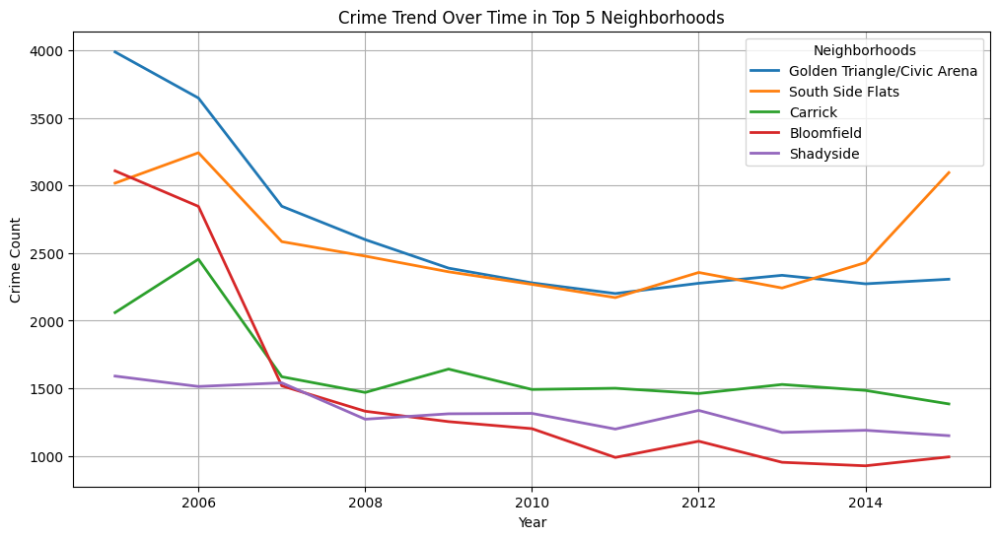

In [15]:
plt.figure(figsize = (12, 6))
top_neighborhoods = crime_trend.sum().nlargest(5).index
crime_trend[top_neighborhoods].plot(figsize = (12, 6), linewidth = 2)
plt.title("Crime Trend Over Time in Top 5 Neighborhoods")
plt.xlabel("Year")
plt.ylabel("Crime Count")
plt.legend(title = "Neighborhoods")
plt.grid(True)
plt.show()

### 🔥 Part 2 – Exploring Fire Rates - Analysis by Joe
A good community should ideally have lower rates of fire to further ensure resident safety in the area.

In [16]:
fireIncidents = pd.read_csv("fireIncidents.csv", encoding = "latin1", low_memory = False)

In [17]:
fireIncidents.head()

,_id,call_no,incident_type,type_description,address,alarms,alarm_time,primary_unit,census_tract,neighborhood,council_district,ward,tract,public_works_division,pli_division,police_zone,fire_zone,latitude,longitude
0,1,F160029985,111.0,Building fire,"800 BLOCK CENTER ST, WILKINSBURG PA 15221",1,2016-04-21T05:01:04,231EN16,NaN,NaN,NaN,NaN,4.200356e+10,NaN,NaN,NaN,3-16,40.441275,-79.882485
1,2,F180022058,111.0,Building fire,"1100 BLOCK JANE ST, WILKINSBURG PA 15221",1,2018-03-13T08:34:43,231EN16,NaN,NaN,NaN,NaN,4.200356e+10,NaN,NaN,NaN,3-21,40.436342,-79.881003
2,3,F180022102,131.0,Passenger vehicle fire,"SB STATE HWY 28 SB AT 31S, PITTSBURGH PA 15212",0,2018-03-13T11:54:23,231EN32,2406.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1-1A,NaN,NaN
3,4,F170043431,131.0,Passenger vehicle fire,"1700 BLOCK BELLEAU DR, PITTSBURGH PA 15212",0,2017-05-31T08:39:47,231EN38,2509.0,Fineview,6.0,25.0,4.200325e+10,1.0,25.0,1.0,1-10,40.460303,-80.006980
4,5,F180021111,111.0,Building fire,"2400 BLOCK VILLAGE RD, PITTSBURGH PA 15205",1,2018-03-09T10:26:42,231EN31,2808.0,Fairywood,2.0,28.0,4.200356e+10,5.0,28.0,6.0,1-16,40.449009,-80.076607


In [18]:
# Deal with Mt. Oliver duplicates (again)
fireIncidents['neighborhood'] = fireIncidents['neighborhood'].replace({
    'Mt. Oliver': 'Mount Oliver',
    'Mount Oliver Borough': 'Mount Oliver'
})

In [19]:
fireIncidents["neighborhood"].unique()

array([nan, 'Fineview', 'Fairywood', 'South Side Flats',
       'Allegheny Center', 'Lincoln-Lemington-Belmar', 'Carrick',
       'Beechview', 'Allentown', 'Beltzhoover', 'Crafton Heights',
       'Homewood North', 'Squirrel Hill South', 'Perry North',
       'Bedford Dwellings', 'Homewood South', 'East Allegheny',
       'Crawford-Roberts', 'Sheraden', 'Middle Hill', 'Strip District',
       'East Hills', 'Garfield', 'Greenfield', 'North Shore',
       'Spring Hill-City View', 'Central Business District', 'Upper Hill',
       'Manchester', 'Overbrook', 'Polish Hill', 'Central Lawrenceville',
       'Brookline', 'Marshall-Shadeland', 'North Oakland',
       'South Oakland', 'Homewood West', 'East Liberty', 'Hazelwood',
       'Squirrel Hill North', 'Friendship', 'West Oakland',
       'Terrace Village', 'Brighton Heights', 'Troy Hill', 'Windgap',
       'Knoxville', 'Upper Lawrenceville', 'Arlington', 'Elliott',
       'South Side Slopes', 'Bloomfield', 'Perry South',
       'Central N

#### A list of neighborhoods with the fewest fires reported:

In [20]:
fire_counts = fireIncidents["neighborhood"].value_counts()
safest_neighborhoods = fire_counts.sort_values().head(10)
print("Safest Neighborhoods (Fewest Fires Reported):")
print(safest_neighborhoods)

Safest Neighborhoods (Fewest Fires Reported):
neighborhood
Regent Square         9
East Carnegie        11
Ridgemont            12
Arlington Heights    13
Oakwood              13
St. Clair            15
Swisshelm Park       17
Chartiers City       18
Mount Oliver         19
Glen Hazel           20
Name: count, dtype: int64


### After totaling up the number of reported fires for each neighborhood, we can see that Regent Square has the fewest. Our winner, Ridgemont, also ranks highly in this list. 

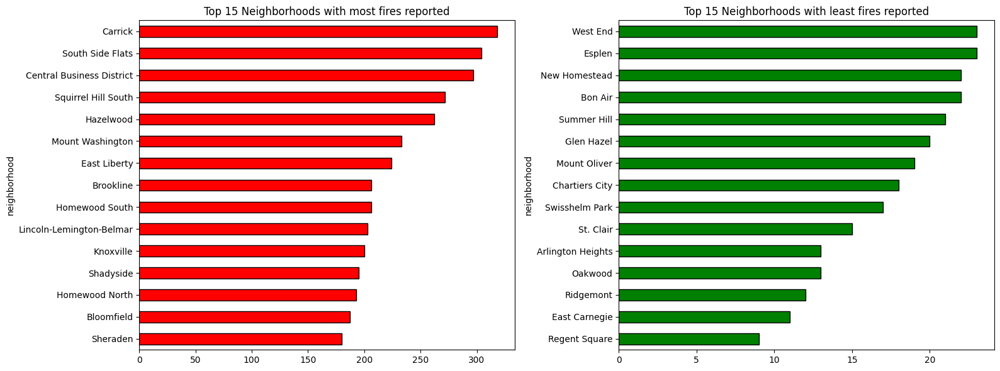

In [21]:
fig, ax = plt.subplots(1, 2, figsize = (16, 6))
fire_counts.head(15).plot(kind = "barh", ax = ax[0], color = "red", edgecolor = "black")
ax[0].set_title("Top 15 Neighborhoods with most fires reported")
ax[0].invert_yaxis()
fire_counts.tail(15).plot(kind = "barh", ax = ax[1], color = "green", edgecolor = "black")
ax[1].set_title("Top 15 Neighborhoods with least fires reported")
ax[1].invert_yaxis()
plt.tight_layout()
plt.show()

### Above we have, similar to the first chart, a visualization--this time with fires reported. Regent Square and Ridgemont are atop, with Carrick and South Side Flats having the most fire incidents reported.

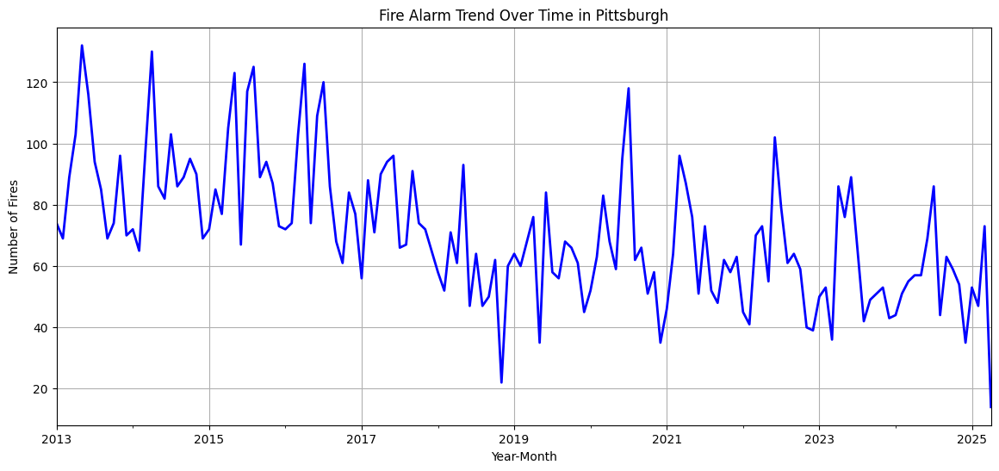

In [22]:
fireIncidents["alarm_time"] = pd.to_datetime(fireIncidents["alarm_time"], errors = "coerce")
fireIncidents["YEAR"] = fireIncidents["alarm_time"].dt.year
fireIncidents["MONTH"] = fireIncidents["alarm_time"].dt.to_period("M")
monthly_fires = fireIncidents["MONTH"].value_counts().sort_index()
plt.figure(figsize = (14, 6))
monthly_fires.plot(color = "blue", linewidth = 2)
plt.title("Fire Alarm Trend Over Time in Pittsburgh")
plt.xlabel("Year-Month")
plt.ylabel("Number of Fires")
plt.grid()

### Also similar to what we did with crimes, we looked at general trends of fire incidents in Pittsburgh as a means of comparison. 

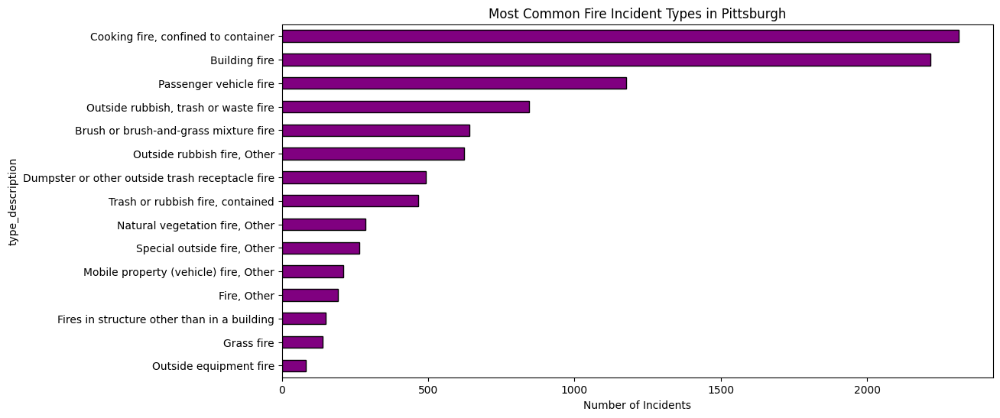

In [23]:
fire_types = fireIncidents["type_description"].value_counts()
plt.figure(figsize = (12, 6))
fire_types.head(15).plot(kind = "barh", color = "purple", edgecolor = "black")
plt.title("Most Common Fire Incident Types in Pittsburgh")
plt.xlabel("Number of Incidents")
plt.gca().invert_yaxis()
plt.show()

### Above we have the most common fire incident types in Pittsburgh, vs the ones in Ridgemont (the winner) below:

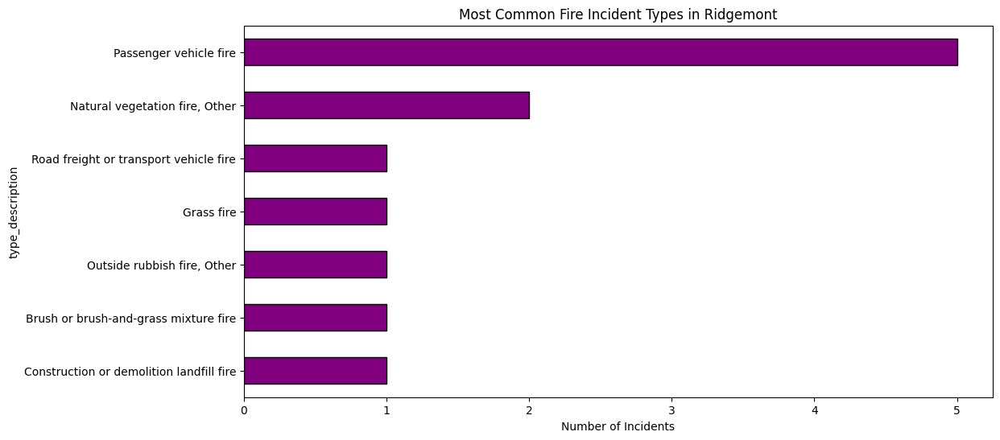

In [24]:
ridgemont_fires = fireIncidents[fireIncidents['neighborhood'] == 'Ridgemont']
fire_types_ridgemont = ridgemont_fires["type_description"].value_counts()
plt.figure(figsize = (12, 6))
fire_types_ridgemont.head(15).plot(kind = "barh", color = "purple", edgecolor = "black")
plt.title("Most Common Fire Incident Types in Ridgemont")
plt.xlabel("Number of Incidents")
plt.gca().invert_yaxis()
plt.show()

### Below is a heatmap of the locations of fires in Pittsburgh neighborhoods (we can, again, do this based upon coordinates given by the data):

In [25]:
fire_data_filtered = fireIncidents.dropna(subset = ["latitude", "longitude"])
fire_data_filtered = fire_data_filtered[(fire_data_filtered["latitude"] != 0) & (fire_data_filtered["longitude"] != 0)]
f = folium.Map(location = [40.4406, -79.9959], zoom_start = 12)
HeatMap(data = fire_data_filtered[["latitude", "longitude"]], radius = 10).add_to(f)
f

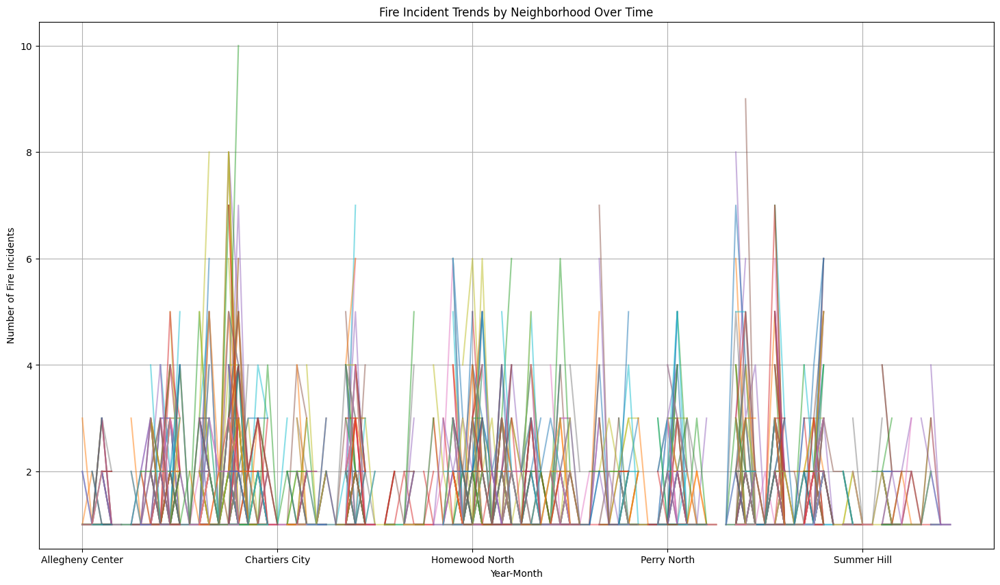

In [26]:
fire_by_neighborhood_month = fireIncidents.groupby(["MONTH", "neighborhood"]).size().unstack()
fire_by_neighborhood_month.T.plot(figsize = (18, 10), alpha = 0.5, legend = False)
plt.title("Fire Incident Trends by Neighborhood Over Time")
plt.xlabel("Year-Month")
plt.ylabel("Number of Fire Incidents")
plt.grid()
plt.show()

#### Lists of neighborhoods with decreasing and increasing fire incidents:

In [27]:
fireIncidents["YEAR"] = fireIncidents["alarm_time"].dt.year
fire_trend = fireIncidents.groupby(["YEAR", "neighborhood"]).size().unstack()
fire_trend_pct_change = fire_trend.pct_change(fill_method = None).fillna(0).mean().sort_values()
print("Neighborhoods with decreasing Fire Incidents:")
print(fire_trend_pct_change.head(10))
print("Neighborhoods with increasing Fire Incidents:")
print(fire_trend_pct_change.tail(10))

Neighborhoods with decreasing Fire Incidents:
neighborhood
West Oakland          -0.138500
Squirrel Hill North   -0.109407
Crawford-Roberts      -0.104945
Homewood North        -0.094973
Perry South           -0.094210
Middle Hill           -0.090182
East Liberty          -0.089032
Hazelwood             -0.088248
Point Breeze          -0.080400
Sheraden              -0.075516
dtype: float64
Neighborhoods with increasing Fire Incidents:
neighborhood
Troy Hill              0.372747
Upper Lawrenceville    0.376374
Strip District         0.380159
Greenfield             0.382872
New Homestead          0.404762
Esplen                 0.416667
Manchester             0.458731
Mount Oliver           0.467949
Hays                   0.615385
West End               0.692308
dtype: float64


#### Ridgemont (the winner) did not place bad nor good in this category. However, given the fact fires are already low in Ridgemont, this is not a massive shocker.

### 🌲 Part 3 – Exploring Parks - Analysis by Manny and Joe
Lastly, a good community should have accessible green spaces for its residents

In [28]:
park_data = pd.read_csv("parks.csv", encoding = "latin1", low_memory = False)

In [29]:
park_data.head()

,_id,id,name,type,maintenance_responsibility,image,neighborhood,council_district,ward,tract,public_works_division,pli_division,police_zone,fire_zone,latitude,longitude
0,1,2111959181,Able Long Park,Park,Parks - Southern,https://tools.wprdc.org/images/pittsburgh/park...,Beechview,4,19,42003192000,5,19,6,4-28,40.408118,-80.028197
1,2,1109513049,Albert Turk Graham Park,Park,Parks - Schenley,https://tools.wprdc.org/images/pittsburgh/park...,Crawford-Roberts,6,3,42003030500,3,3,2,2-1,40.440507,-79.984018
2,3,1544096765,Alcoa Park,Park,Parks - Northern,NaN,North Shore,1,22,42003563200,6,22,1,1-20,40.447481,-80.001017
3,4,1212681573,Allegheny Commons,Park,Parks - Northern,NaN,Allegheny Center,1,22,42003562700,1,22,1,1-7,40.453126,-80.009158
4,5,954863286,Allegheny Landing Park,Park,Parks - Northern,NaN,North Shore,1,22,42003563200,6,22,1,1-20,40.447184,-80.002907


In [30]:
park_data["neighborhood"].unique()

array(['Beechview', 'Crawford-Roberts', 'North Shore', 'Allegheny Center',
       'Central Business District', 'Central Northside', 'East Liberty',
       'Bedford Dwellings', 'South Side Slopes', 'South Side Flats',
       'Lower Lawrenceville', 'Banksville', 'South Oakland',
       'Homewood North', 'Hazelwood', 'Bon Air', 'Central Oakland',
       'Brighton Heights', 'Brookline', 'Spring Garden',
       'Lincoln-Lemington-Belmar', 'Windgap', 'Troy Hill', 'Westwood',
       'Perry South', 'Homewood West', 'Squirrel Hill South',
       'Strip District', 'Arlington', 'Stanton Heights',
       'Crafton Heights', 'Upper Lawrenceville', 'East Carnegie',
       'East Hills', 'Point Breeze', 'Allentown', 'Duquesne Heights',
       'Mount Washington', 'Esplen', 'Fairywood', 'Fineview', 'Garfield',
       'Greenfield', 'Larimer', 'Bloomfield', 'Perry North',
       'North Oakland', 'Hays', 'Elliott', 'Highland Park',
       'Homewood South', 'Morningside', 'Terrace Village',
       'Spring Hi

#### The neighborhoods with the largest park count:

In [31]:
neighborhood_park_counts = park_data['neighborhood'].value_counts()
print("Top Neighborhoods by Park Count:")
print(neighborhood_park_counts.head(10))

Top Neighborhoods by Park Count:
neighborhood
East Liberty                 12
Central Business District    10
Beechview                     8
South Side Slopes             7
Point Breeze                  7
Hazelwood                     6
Squirrel Hill South           6
South Side Flats              6
Mount Washington              6
Sheraden                      6
Name: count, dtype: int64


### If this was the only metric measured, East Liberty would be the best neighborhood.

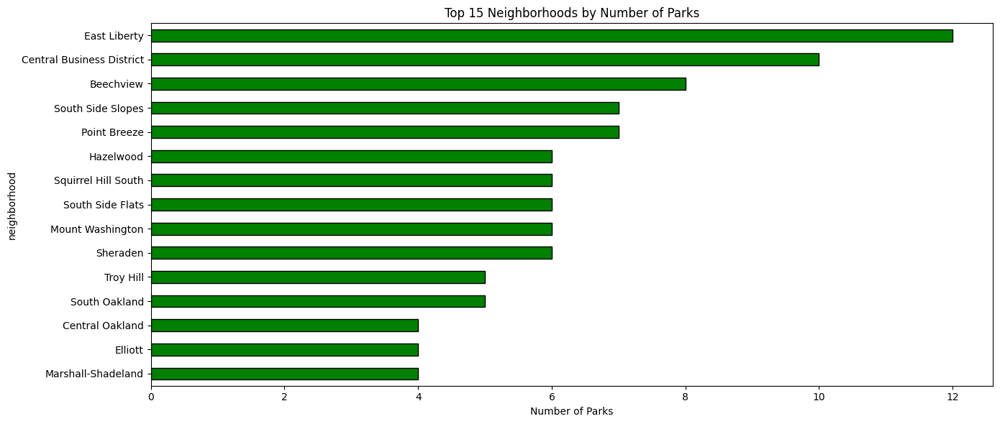

In [32]:
plt.figure(figsize = (14, 6))
neighborhood_park_counts.head(15).plot(kind = 'barh', color = 'green', edgecolor = 'black')
plt.title("Top 15 Neighborhoods by Number of Parks")
plt.xlabel("Number of Parks")
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

Top maintenance responsibilities divisons listed below:

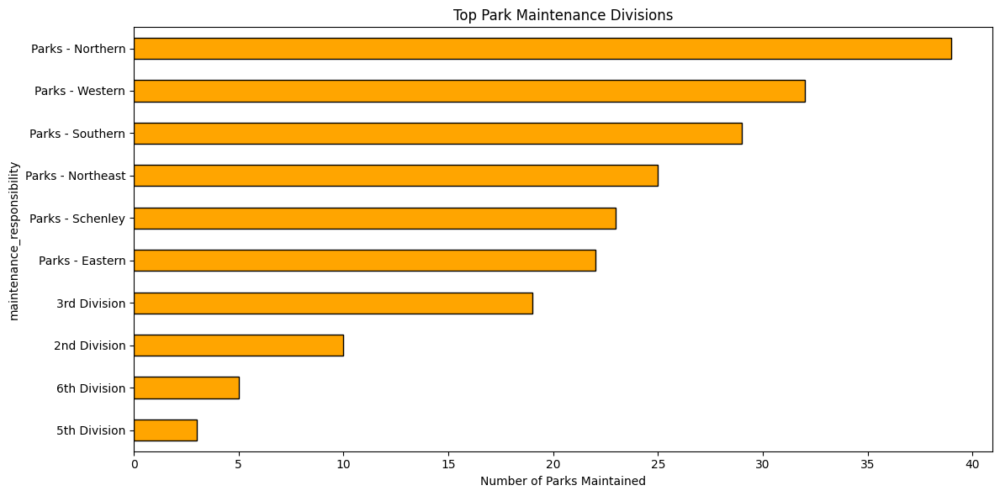

In [33]:
maintenance_counts = park_data['maintenance_responsibility'].value_counts()

plt.figure(figsize = (12, 6))
maintenance_counts.head(10).plot(kind = 'barh', color = 'orange', edgecolor = 'black')
plt.title("Top Park Maintenance Divisions")
plt.xlabel("Number of Parks Maintained")
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

A cluster map of all the parks listed in the dataset below:

In [34]:
parks_with_coords = park_data.dropna(subset=['latitude', 'longitude'])

park_map = folium.Map(location=[40.4406, -79.9959], zoom_start=12)

marker_cluster = MarkerCluster().add_to(park_map)

for _, row in parks_with_coords.iterrows():
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        popup=row['name'],
        tooltip=row['neighborhood']
    ).add_to(marker_cluster)

park_map

# Results:

### 🧮 Scoring Criteria

*Note: Scalars are calculated based on placement. Towns with higher placement receive higher scalar multipliers in the weighted score.*

| **Placement Rank** | **Scalar Points** |
|--------------------|-------------------|
| 1st                | 5 points          |
| 2nd–3rd            | 4 points          |
| 4th–5th            | 2 points          |
| 6th and beyond     | 0 points          |

#### 🧾 Formula for Town Scores

$\text{Town Score} = (\text{Crime Volume Scalar} \cdot 0.20) + (\text{Crime Change Scalar} \cdot 0.25) + (\text{Fire Volume Scalar} \cdot 0.20) + (\text{Fire Change Scalar} \cdot 0.25) + (\text{Parks Volume} \cdot 0.10)$

In [35]:
def assign_scalar(rank):
    if rank == 1:
        return 5
    elif rank in [2, 3]:
        return 4
    elif rank in [4, 5]:
        return 2
    else:
        return 0

In [36]:
# --- NOTHING OUTSIDE OF ALLEGHENY COUNTY!! ---
excluded_names = ["Outside County", "Outside State", "Outside City"]

# --- CRIME VOLUME SCALAR ---
crime_volume = crime_data["INCIDENTNEIGHBORHOOD"].value_counts()
crime_volume = crime_volume[~crime_volume.index.isin(excluded_names)].sort_values()
crime_volume_df = pd.DataFrame(crime_volume)
crime_volume_df.columns = ['crime_count']
crime_volume_df["rank"] = range(1, len(crime_volume_df) + 1)
crime_volume_df["crime_volume_scalar"] = crime_volume_df["rank"].apply(assign_scalar)

# --- CRIME TREND SCALAR ---
crime_data["YEAR"] = crime_data["INCIDENTTIME"].dt.year
crime_trend = crime_data.groupby(["YEAR", "INCIDENTNEIGHBORHOOD"]).size().unstack()
crime_trend = crime_trend.drop(columns = excluded_names, errors = 'ignore')
crime_trend_pct_change = crime_trend.pct_change(fill_method = None).fillna(0).mean().sort_values()
crime_trend_df = pd.DataFrame(crime_trend_pct_change)
crime_trend_df.columns = ['crime_change']
crime_trend_df["rank"] = range(1, len(crime_trend_df) + 1)
crime_trend_df["crime_change_scalar"] = crime_trend_df["rank"].apply(assign_scalar)

# --- FIRE VOLUME SCALAR ---
fire_volume = fireIncidents["neighborhood"].value_counts()
fire_volume = fire_volume[~fire_volume.index.isin(excluded_names)].sort_values()
fire_volume_df = pd.DataFrame(fire_volume)
fire_volume_df.columns = ['fire_count']
fire_volume_df["rank"] = range(1, len(fire_volume_df) + 1)
fire_volume_df["fire_volume_scalar"] = fire_volume_df["rank"].apply(assign_scalar)

# --- FIRE TREND SCALAR ---
fireIncidents["alarm_time"] = pd.to_datetime(fireIncidents["alarm_time"], errors = "coerce")
fireIncidents["YEAR"] = fireIncidents["alarm_time"].dt.year
fire_trend = fireIncidents.groupby(["YEAR", "neighborhood"]).size().unstack()
fire_trend = fire_trend.drop(columns = excluded_names, errors = 'ignore')
fire_trend_pct_change = fire_trend.pct_change(fill_method = None).fillna(0).mean().sort_values()
fire_trend_df = pd.DataFrame(fire_trend_pct_change)
fire_trend_df.columns = ['fire_change']
fire_trend_df["rank"] = range(1, len(fire_trend_df) + 1)
fire_trend_df["fire_change_scalar"] = fire_trend_df["rank"].apply(assign_scalar)

# --- PARK VOLUME SCALAR ---
park_volume = park_data["neighborhood"].value_counts()
park_volume = park_volume[~park_volume.index.isin(excluded_names)].sort_values()
park_volume_df = pd.DataFrame(park_volume)
park_volume_df.columns = ['park_count']
park_volume_df["rank"] = range(1, len(park_volume_df) + 1)
park_volume_df["park_volume_scalar"] = park_volume_df["rank"].apply(assign_scalar)

# --- MERGE LITERALLY EVERYTHING ---
final = crime_volume_df[["crime_volume_scalar"]].merge(
    crime_trend_df[["crime_change_scalar"]], left_index = True, right_index = True, how = "outer"
).merge(
    fire_volume_df[["fire_volume_scalar"]], left_index = True, right_index = True, how = "outer"
).merge(
    fire_trend_df[["fire_change_scalar"]], left_index = True, right_index = True, how = "outer"
).merge(
    park_volume_df[["park_volume_scalar"]], left_index = True, right_index = True, how = "outer"
)

final = final.fillna({"park_volume_scalar": 0, "crime_volume_scalar": 0, "crime_change_scalar": 0, "fire_volume_scalar": 0, "fire_change_scalar": 0})

# --- FINAL SCORE (BASED ON CRITERION POSTED ABOVE) ---
final["final_score"] = (
    0.20 * final["crime_volume_scalar"] +
    0.25 * final["crime_change_scalar"] +
    0.20 * final["fire_volume_scalar"] +
    0.25 * final["fire_change_scalar"] +
    0.10 * final["park_volume_scalar"]
)

# --- RESULTS AND WINNER! ---
final_sorted = final.sort_values("final_score", ascending = False)
print("Best Overall Neighborhoods:")
print(final_sorted.head(5))

Best Overall Neighborhoods:
               crime_volume_scalar  crime_change_scalar  fire_volume_scalar  \
Ridgemont                      0.0                  4.0                 4.0   
St. Clair                      0.0                  5.0                 0.0   
West Oakland                   0.0                  0.0                 0.0   
East Carnegie                  2.0                  0.0                 4.0   
Homewood West                  0.0                  4.0                 0.0   

               fire_change_scalar  park_volume_scalar  final_score  
Ridgemont                     0.0                 0.0         1.80  
St. Clair                     0.0                 0.0         1.25  
West Oakland                  5.0                 0.0         1.25  
East Carnegie                 0.0                 0.0         1.20  
Homewood West                 0.0                 2.0         1.20  


### **Ridgemont** is the neighborhood with the best overall score after tallying up!

### Why? What makes our champion so special?

#### Ridgemont – Scoring Breakdown:

| **Metric**       | **Score (out of max scalar value 5)**              |
|------------------|----------------------------------------------------|
| **Crime Volume** | 0.0 — Did not place                                |
| **Crime Trend**  | 4.0 — Trending very well                           |
| **Fire Volume**  | 4.0 — Very low amount of fires                     |
| **Fire Trend**   | 0.0 — Did not place                                |
| **Park Volume**  | 0.0 — Not in parks dataset, so zero                |
| **Overall Score**| **1.80** — Positive results across most metrics    |

**Some potential factors:**
1. In the context of greater Pittsburgh, Ridgemont could be an "underrated" area so-to-speak. Many people may want to live in flashier parts of Pittsburgh and Allegheny county, but Ridgemont offers a good retreat from being directly in the city while also benefiting from the county.

2. Ridgemont doesn't seem to have many fires, making it a less chaotic enviornment overall when paired with the fact the crime rate is moving in the right direction.

3. The trending downward crime rate makes it an excellent place for families to consider, as somewhat prefaced in point 1. As families move in and neighborhood crime watches settle in, as well as more taxpayer dollars, this will allow for a safer community overall (potentially reflecting why we see a lowering crime rate in this town).

4. Ridgemont performs well where it matters, especially with regards to crime trending downwards--one could make the argument this is the most important thing for a town's value.

5. This is all despite the fact Ridgemont is not even apart of the parks dataset! Ridgemont wins despite the fact other towns were pretty much given a handicap.

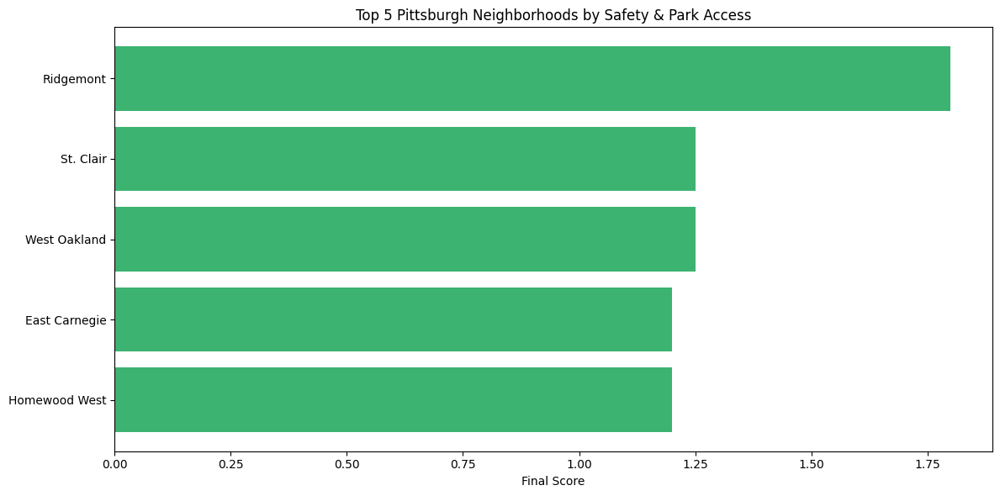

In [37]:
top10 = final_sorted.head(5).reset_index()
plt.figure(figsize=(12, 6))
plt.barh(top10["index"], top10["final_score"], color='mediumseagreen')
plt.xlabel("Final Score")
plt.title("Top 5 Pittsburgh Neighborhoods by Safety & Park Access")
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()